# Semantic Signal Separation Topic Extraction from PDF with Hybrid RAG using Neo4j and DeepSeekR1 LLM
* Notebook by Adam Lang
* Date: 2/5/2025


# Overview
* The general concept is this.
* An open source PDF document from Moderna was used for this, freely available on their website: https://investors.modernatx.com/events-and-presentations/events/default.aspx

1. Offline social media messages were pre-processed by first detecting the language in the message using `xlm-roberta` via huggingface. There were some non-english messages so I omitted these and kept only the english messages.
2. The messages are then chunked and ingested into Neo4j vector database using the `LLMGraphTransformer` which is an out of the box function available via Neo4j. The LLM used for this is open-source via GROQ API and is the `deepseek-r1-distill-llama-70b`.
3. A user uploads a PDF file which in this case is an open source financial document from Moderna. Extraction is performed of the PDF to markdown and then text. `PyMuPDF4LLM` was used for this.
4. Topics/keywords are extracted using Semantic Signal Separation (independent component analysis) via the TurfTopic Python library.
5. The topics and keywords are then fed into a multi-stage approach:
  * Clustering is performed using a SentenceTransformer model `all-MiniLM-L6-v2`.
  * Synonyms are then generated for each topic.
  * The topics/keywords and synonyms are then fed to the LLM using prompts to ask it to use Chain of Thought prompting to generate 3 prompts or "queries" that could be fed to the RAG system to "ask questions of the award messages" using the topics/keywords from the PDF document.
6. RAG is then performed on the original award messages stored in the Neo4j vector database. This uses 3 retrievers which allow for "keyword", "semantic/vector" and "graph" based search.
7. Based on the provided vectors from the award messages, the LLM then concatenates all the information and synthesizes a response or summarization using chain of thought prompting.

# Architecture
* The approach that I am going to take with this is to perfrom RAG (retrieval augmented generation) on social media messages using information extracted (topics/keywords) from a PDF file.
* The method that I am going to use is called "Hybrid RAG" which uses a vector database and a graph database (Neo4j Aura).
* The reasoning behind this is that it gives you 3 things:

1. Keyword Search
2. Semantic Search
3. Entity-Relationship based search (Graph Search)

# Technical Approach
* I crafted the pipeline diagram below using Excalidraw. It demonstrates the architecture of what will be built in this notebook.

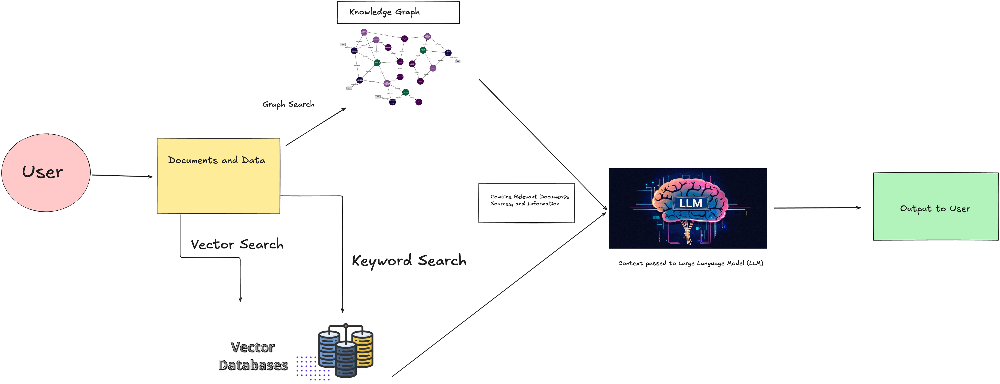

# Technical Components
1. LangChain
2. Neo4j Aura Graph Database (free tier)
3. GROQ API using DeepSeek R1 LLM
   * DeepSeek R1 is unique in that it leverages "Chain of Thought" which uses reasoning, error identification and self-correction much like a human to find the answer to a query based on the information given.
4. Hugging Face open source embeddings

# Install Dependencies

In [1]:
# %%capture
!pip install --upgrade --quiet langchain langchain-community langchain-openai langchain-experimental langchain-neo4j wikipedia tiktoken yfiles_jupyter_graphs langchain-groq langchain-huggingface sentence-transformers

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 37.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.3/55.3 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.2/209.2 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 63.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 51.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 414.3/414.3 kB 32.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 312.3/312.3 kB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 101.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.7 MB/s eta 0:00:00
   ━

# Setup Environment Variables
* We have to setup the environment variables for the LLM and Neo4j.
* This will be transferred to a `.env` file for building the final POC.
* We need to setup API key info for:
  1) GROQ API for open source LLM access
  2) Neo4j Aura DB open source graph DB access

## GROQ LLM API key setup

In [2]:
## password/key setup
from getpass import getpass
import os

## enter your GROQ key
GROQ_API_KEY = getpass('Enter your GROQ API Key: ')

Enter your GROQ API Key: ··········


In [3]:
## now set the GROQ env variable
os.environ['GROQ_API_KEY'] = GROQ_API_KEY

## Neo4j Aura DB setup
* This is my own personal free instance of Neo4j Aura DB.
* It is very easy to set up your own Aura instance, just go here and setup a free account: https://neo4j.com/product/auradb/
* To get the variables below you will need to setup a new Aura instance and then download the API keys locally.

In [4]:
NEO4J_URI="<your key goes here>"
NEO4J_USERNAME="<your key goes here>"
NEO4J_PASSWORD="<your key goes here>"


In [5]:
## set NEO4J environment variables
os.environ["NEO4J_URI"]=NEO4J_URI
os.environ["NEO4J_USERNAME"]=NEO4J_USERNAME
os.environ["NEO4J_PASSWORD"]=NEO4J_PASSWORD
#NEO4J_DATABASE=os.environ["NEO4J_DATABASE"]
#AURA_INSTANCENAME=os.environ["AURA_INSTANCENAME"]
#AUTH=(NEO4J_USERNAME, NEO4J_PASSWORD)

Run this code below to setup the Neo4j graph database instance.

In [6]:
from langchain_neo4j import Neo4jGraph
from neo4j import GraphDatabase

## need to setup a driver for NEO4J Graph DB
#driver = GraphDatabase.driver(NEO4J_URI, auth=AUTH)


## init graph instance
graph = Neo4jGraph()

# AWS SageMaker Dependencies
* Before proceeding we need to install SageMaker dependencies to work with S3 buckets.

In [ ]:
%%capture
!pip install einops


In [ ]:
%%capture
!pip install --upgrade pandas fsspec # sagemaker dependency



In [ ]:
%%capture
!pip install seaborn
!pip install s3fs #sagemaker dependency


In [ ]:
%%capture
## upgrade torchvision
!pip install --upgrade torchvision # if you need to upgrade torchvision run this line
!pip install --upgrade torch #upgrade torch version

## PyTorch Memory Allocation
* Addressing Fragmentation:
  * The primary goal of setting `PYTORCH_CUDA_ALLOC_CONF` is to mitigate memory fragmentation, which can be an issue even after restarting the runtime.
  * Placing it before model loading and operations may improve memory usage.
  * Experiment with Values:
    * You might need to experiment with different values for `max_split_size_mb` (e.g., 64, 256) to find what works best for your specific model and data.

In [7]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:128"

In [8]:
# check versions of torch available
import torch
import torchvision

# print versions
print(f"PyTorch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")

PyTorch version: 2.5.1+cu124
Torchvision version: 0.20.1+cu124


In [9]:
# check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# set device for PyTorch operations
if device.type == "cuda":
    torch.cuda.set_device(0) # you can use a different device ID if you have multiple GPUs running

Using device: cuda


In [10]:
## install dependencies
## standard Data Science imports
import pandas as pd
import numpy as np

## plotting
import matplotlib.pyplot as plt
import matplotlib as mpl
from IPython.display import HTML
import seaborn as sns

## other tools
#import response_compare
import re
import functools
from copy import deepcopy
#import chardet
import html #for non ascii detection

## transformers and huggingface
import transformers
#from sentence_transformers import SentenceTransformer, util
import torch
import torchvision ## to use Qwen
import huggingface_hub

## tqdm and pandas
from tqdm.auto import tqdm
tqdm.pandas(leave=False)
#from hashlib import sha256

## Hugging Face Credentials
* Setup hugging face credentials for notebook access.

In [ ]:
## hf hub login
from huggingface_hub import notebook_login
notebook_login()

# Data Loading and Pre-Processing --- if using SageMaker
* **NOTE: This next part was done for pre-processing the data from the S3 bucket**
* We will load the award messages CSV raw data file from an S3 bucket.
* We will pre-process the data and take a sample of these for this experiment.

In [ ]:
import boto3
import pandas as pd
from sagemaker import get_execution_role

# Create S3 client
conn = boto3.client('s3')

# S3 bucket name
bucket = '<your bucket goes here>'

# Correct data_key (remove the leading slash)
data_key = '<name of file goes here>.pkl'

# Construct the full S3 URI
data_location = f's3://{bucket}/{data_key}'

# Load the DataFrame
try:
    df = pd.read_pickle(data_location)
    print(df.head())
except Exception as e:
    print(f"An error occurred: {e}")

    # List objects in the bucket to check if the file exists
    response = conn.list_objects_v2(Bucket=bucket, Prefix='<file path>/<file_path>/')

    if 'Contents' in response:
        print("Files in the specified S3 location:")
        for obj in response['Contents']:
            print(obj['Key'])
    else:
        print("No files found in the specified S3 location.")


sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/sagemaker-user/.config/sagemaker/config.yaml
      rec_id    nom_id   award_id      ah_id    link_id   group_id  \
0   26062725  14400797  183277261  180514838        NaN  155298285   
2   17092356  26807710  182230718  180514685        NaN  154490006   
9   19243986  29376603  183172234  180514321  9565735.0  155223601   
21  14400575  28676964  183302439  180514194  9577413.0  155315544   
25  28382822  28751028  183298362  180514058  9576992.0  155313138   

    award_private  product_id award_type   award_reason  \
0               0         620     Stride  Collaborative   
2               0         620      Scale  Collaborative   
9               0         620      Scale  Collaborative   
21              0         620     Salute  Collaborative   
25              0         620     Stride  Collaborative   

            

In [ ]:
## df.head()
df.head()

,rec_id,nom_id,award_id,ah_id,link_id,group_id,award_private,product_id,award_type,award_reason,title,message,award_date,value,remaining_value,freq
0,26062725,14400797,183277261,180514838,NaN,155298285,0,620,Stride,Collaborative,First IND writing support,"As I'm working on my first IND submission, I'm...",2024-12-30,35.0,0.0,1
2,17092356,26807710,182230718,180514685,NaN,154490006,0,620,Scale,Collaborative,Osmometer IOQ,Thank you for your demonstration of the new os...,2024-12-30,70.5,70.5,1
9,19243986,29376603,183172234,180514321,9565735.0,155223601,0,620,Scale,Collaborative,Great team work to support first PPQ at Harwell,The entire Manufacturing Team 2 demonstrated e...,2024-12-30,70.5,70.5,9
21,14400575,28676964,183302439,180514194,9577413.0,155315544,0,620,Salute,Collaborative,Dream Team,I want to express my gratitude for the unwaver...,2024-12-30,0.0,0.0,4
25,28382822,28751028,183298362,180514058,9576992.0,155313138,0,620,Stride,Collaborative,TEAM WORK AND WORK ETHIC,I want to thank everyone for their great teamw...,2024-12-30,30.5,0.0,4


# Exploratory Data Analysis (EDA)

In [ ]:
## info
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19026 entries, 0 to 148693
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   rec_id           19026 non-null  int64  
 1   nom_id           19026 non-null  int64  
 2   award_id         19026 non-null  int64  
 3   ah_id            19026 non-null  int64  
 4   link_id          5351 non-null   float64
 5   group_id         19026 non-null  int64  
 6   award_private    19026 non-null  int64  
 7   product_id       19026 non-null  int64  
 8   award_type       19026 non-null  object 
 9   award_reason     19026 non-null  object 
 10  title            19021 non-null  object 
 11  message          19026 non-null  object 
 12  award_date       19026 non-null  object 
 13  value            19026 non-null  float64
 14  remaining_value  19026 non-null  float64
 15  freq             19026 non-null  int64  
dtypes: float64(3), int64(8), object(5)
memory usage: 2.5+ MB


In [ ]:
## columns
df.columns

Index(['rec_id', 'nom_id', 'award_id', 'ah_id', 'link_id', 'group_id',
       'award_private', 'product_id', 'award_type', 'award_reason', 'title',
       'message', 'award_date', 'value', 'remaining_value', 'freq'],
      dtype='object')

In [ ]:
## create copy of df
df2 = df.copy()
df2.head()

,rec_id,nom_id,award_id,ah_id,link_id,group_id,award_private,product_id,award_type,award_reason,title,message,award_date,value,remaining_value,freq
0,26062725,14400797,183277261,180514838,NaN,155298285,0,620,Stride,Collaborative,First IND writing support,"As I'm working on my first IND submission, I'm...",2024-12-30,35.0,0.0,1
2,17092356,26807710,182230718,180514685,NaN,154490006,0,620,Scale,Collaborative,Osmometer IOQ,Thank you for your demonstration of the new os...,2024-12-30,70.5,70.5,1
9,19243986,29376603,183172234,180514321,9565735.0,155223601,0,620,Scale,Collaborative,Great team work to support first PPQ at Harwell,The entire Manufacturing Team 2 demonstrated e...,2024-12-30,70.5,70.5,9
21,14400575,28676964,183302439,180514194,9577413.0,155315544,0,620,Salute,Collaborative,Dream Team,I want to express my gratitude for the unwaver...,2024-12-30,0.0,0.0,4
25,28382822,28751028,183298362,180514058,9576992.0,155313138,0,620,Stride,Collaborative,TEAM WORK AND WORK ETHIC,I want to thank everyone for their great teamw...,2024-12-30,30.5,0.0,4


## Language Detection
* Check if messages are all english language or not.
* We will use the `xlm-roberta-base-language-detection` transformer trained on 20 languages.
* We will get the model from the huggingface hub.
* We will use the huggingface pipeline for immediate inference rather than loading the model and the tokenizer we can use it out of the box this way: https://huggingface.co/docs/transformers/main_classes/pipelines

In [ ]:
# load pipeline
from transformers import pipeline

## load model from HF
model = pipeline(
    'text-classification',
    model="papluca/xlm-roberta-base-language-detection",
    truncation=True,
    max_length=512
)


2025-02-25 19:31:12.042724: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-25 19:31:12.059536: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-25 19:31:12.064585: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-25 19:31:12.076548: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Device set to use cuda:0


### Detect Language
* We define a safe_text function that converts NaN values to empty strings and ensures all other values are strings.
* We apply this function to the 'message' column before converting it to a list.
* This ensures that all_text contains only strings, which the model can process.
* By handling the NaN values and ensuring all inputs are strings, you should avoid the ValueError you were encountering.
*Note: For empty strings (which replace NaN values), the model will still make a prediction, but it might not be meaningful. You may want to handle these cases separately in your analysis, perhaps by assigning a special label like "unknown" or "not applicable" for entries that were originally NaN.

In [ ]:
from tqdm import tqdm
tqdm.pandas() # load tqdm for pandas

# Function to safely process text with nan values
def safe_text(text):
    if pd.isna(text):
        return ""  # Return empty string for NaN values
    return str(text)  # Ensure all non-NaN values are strings

# Apply safe_text function to your column with progress bar
df2['message'] = df2['message'].progress_apply(safe_text)

# Function to process batches
def process_batch(texts):
    results = model(texts.tolist(), batch_size=32)
    return [d['label'] for d in results]

# Process in batches with a progress bar
batch_size = 1000  # Adjust this based on memory constraints
num_batches = len(df2) // batch_size + (1 if len(df2) % batch_size != 0 else 0)

language_labels = []
for i in tqdm(range(num_batches), desc="Processing batches"):
    start_idx = i * batch_size
    end_idx = min((i + 1) * batch_size, len(df2))
    batch_texts = df2['message'].iloc[start_idx:end_idx]
    language_labels.extend(process_batch(batch_texts))

# Assign labels to DataFrame
df2['language_label'] = language_labels

# Print head
print(df2.head())

Processing batches: 100%|██████████| 20/20 [00:54<00:00,  2.75s/it]

      rec_id    nom_id   award_id      ah_id    link_id   group_id  \
0   26062725  14400797  183277261  180514838        NaN  155298285   
2   17092356  26807710  182230718  180514685        NaN  154490006   
9   19243986  29376603  183172234  180514321  9565735.0  155223601   
21  14400575  28676964  183302439  180514194  9577413.0  155315544   
25  28382822  28751028  183298362  180514058  9576992.0  155313138   

    award_private  product_id award_type   award_reason  \
0               0         620     Stride  Collaborative   
2               0         620      Scale  Collaborative   
9               0         620      Scale  Collaborative   
21              0         620     Salute  Collaborative   
25              0         620     Stride  Collaborative   

                                              title  \
0                         First IND writing support   
2                                     Osmometer IOQ   
9   Great team work to support first PPQ at Harwell   
21  

In [ ]:
## view language labels
df2['language_label'].value_counts().reset_index()

,language_label,count
0,en,19006
1,fr,7
2,de,4
3,es,4
4,ur,2
5,it,1
6,ja,1
7,pl,1


In [ ]:
%%capture
!pip install plotly-express

In [ ]:
import plotly.express as px
## show languages detected
plot_title = "Languages Detected"
## create labels for x and y axis
labels = {
    "x": "Language",
    "y": "Count of text"
}
## plot histogram of languages for xlm-robeta model
fig = px.histogram(df2, x="language_label", template="plotly_dark",
                   title=plot_title,
                   labels=labels)


fig.show()

In [ ]:
## view other languages
filtered_df = df2[df2['language_label'] == 'es'][['message', 'language_label']]
filtered_df['message'].iloc[0]

## Dataset Filtering
* I will filter the dataset for English messages ("en" in the "language_label" column).
* I will only Filter for messages longer than 5 words.
* I will only select these columns: award_reason, award_type, message, title
* Lastly, I will randomly sample 30% of the resulting data.


In [ ]:
## len df2
len(df2)

In [ ]:
## 30% of df2
.30*(len(df2))

In [ ]:
# Function to count words in a string, handling NaN and non-string types
def word_count(text):
    if isinstance(text, str):
        return len(text.split())
    return 0  # Return 0 for NaN or non-string values

# Filter for English messages, non-null messages, and messages longer than 5 words
df_filtered = df2[
    (df2['language_label'] == 'en') &
    (df2['message'].notna()) &  # Filter out NaN values
    (df2['message'].astype(str).apply(word_count) > 5)  # Convert to string before counting words
]

# Select only the specified columns
columns_to_keep = df2.columns ## or select specific columns --> ["award_type", "award_reason", "message", "title"]
df_selected = df_filtered[columns_to_keep]

# Randomly sample 25% of the dataset
sample_size = int(len(df_selected) * 0.25)
df_sample = df_selected.sample(n=sample_size, random_state=42) ## set seed

# Reset the index of the resulting dataframe
df_sample = df_sample.reset_index(drop=True)

# Print some information about the new sample
print(f"Original dataset size: {len(df2)}")
print(f"Filtered dataset size (English messages > 5 words): {len(df_filtered)}")
print(f"Final sample size (25% of filtered dataset): {len(df_sample)}")

# Optional: Save the sample to a CSV file
#df_sample.to_csv("sample_dataset.csv", index=False)
#print("Sample dataset saved to 'sample_dataset.csv'")

# Display the first few rows of the sample
print(df_sample.head())

# Additional check: Display data types of the columns
print(df_sample.dtypes)

# Check for any remaining NaN values
print(df_sample.isnull().sum())

Original dataset size: 19026
Filtered dataset size (English messages > 5 words): 18956
Final sample size (25% of filtered dataset): 4739
     rec_id    nom_id   award_id      ah_id    link_id   group_id  \
0  15440414  16472998  126903139  128530907  4595881.0  107360381   
1  16472970  15710875  100239850   98978537        NaN   84729120   
2  15492743  14483808  145389661  146556530  6147035.0  123142452   
3  19395078  14483827  104341068  102874523  2791718.0   88207684   
4  23053010  16852060  118496032  117106840        NaN  100239604   

   award_private  product_id award_type   award_reason  \
0              0         620       Soar        Curious   
1              0         620      Scale  Collaborative   
2              0         620       Soar  Collaborative   
3              0         620      Scale  Collaborative   
4              0         620       Soar  Collaborative   

                                          title  \
0                          VRBPAC contributions 

In [ ]:
## df_sample
df_sample.head()

,rec_id,nom_id,award_id,ah_id,link_id,group_id,award_private,product_id,award_type,award_reason,title,message,award_date,value,remaining_value,freq,language_label
0,15440414,16472998,126903139,128530907,4595881.0,107360381,0,620,Soar,Curious,VRBPAC contributions,"Thank you Daina, David, and Cindy for stretchi...",2023-03-27,220.0,0.0,3,en
1,16472970,15710875,100239850,98978537,NaN,84729120,0,620,Scale,Collaborative,Document Team,Thanks Nick! for working with me and training ...,2022-02-15,55.0,0.0,1,en
2,15492743,14483808,145389661,146556530,6147035.0,123142452,0,620,Soar,Collaborative,INT LMX Aliquoting Engineering Test Protocol,A sincere thank you to this team for planning ...,2023-11-25,220.0,0.0,6,en
3,19395078,14483827,104341068,102874523,2791718.0,88207684,0,620,Scale,Collaborative,eBR Review Support,Thank you for supporting eBR review! Your help...,2022-04-11,55.0,0.0,2,en
4,23053010,16852060,118496032,117106840,NaN,100239604,0,620,Soar,Collaborative,Team Player,Thank you for returning a whole kit to the war...,2022-11-07,220.0,0.0,1,en


In [ ]:
## len
len(df_sample)

4739

In [ ]:
## export df_sample to csv
df_sample.to_csv('Moderna_English_Messages.csv',index=False)

# Load English Only Pre-Processed Dataset
* The sample dataset will be loaded here.

In [12]:
data_path = "<local path to data>"
df_sample = pd.read_csv(data_path)
df_sample.head()

,rec_id,nom_id,award_id,ah_id,link_id,group_id,award_private,product_id,award_type,award_reason,title,message,award_date,value,remaining_value,freq,language_label
0,26537894,14400940,150668901,148353999,6646904.0,127568054,0,620,Scale,Curious,EDL Initial Update/Review,I wanted to take this moment to thank all thre...,2023-12-14,55.0,55.0,3,en
1,23710894,26667760,182946239,180378611,NaN,155056666,0,620,Surge,Collaborative,Amazing Trainer,Thank you so much Nideesha for walking me thro...,2024-12-29,140.0,140.0,1,en
2,19243976,16105466,104888160,103629111,NaN,88673263,1,620,Summit,Relentless,Outstanding organization of WVC event,Fred has been a remarkable security provider a...,2022-04-26,550.0,0.0,1,en
3,27184657,26342796,160984938,159579637,7512717.0,136375754,0,620,Step,Collaborative,Completion of 2nd Isolator MBRs for Qualification,Thank you for supporting the 2nd Isolator MBR ...,2024-04-29,16.0,11.5,5,en
4,16473006,17353175,145710322,143608692,NaN,123414789,0,620,Scale,Collaborative,Collaborating with MFG support,"Stanford took the time out of his busy day, to...",2023-10-14,55.0,0.0,1,en


In [13]:
## len
len(df_sample)

470

In [14]:
## to list
docs = df_sample['message'].tolist()
docs[:10]

["I wanted to take this moment to thank all three of you for being open to taking on the initial review and updating of EDLs for the pilot study. This was a new process and you all jumped right in, asked great questions, and really took ownership of your section to make sure it was completed and ready for the study team to review. Even if this wasn't your study, you all really stepped up and were eager to learn. Thank you soo much and look forward to see how you all continue to grow!!",
 'Thank you so much Nideesha for walking me through the SmartSheet application with such ease and simplicity. The way you create the sheets we the team uses makes are sut up in a way we can all understand.  I have great admiration for your experience and skill. Thank you for taking me on this incredible journey!',
 'Fred has been a remarkable security provider and partner for the CMO organization',
 'Thank you for supporting the 2nd Isolator MBR close out to support qualification of the 2nd INT DP isola

In [15]:
len(docs)

470

# Document Splitting & Chunking
* **Important note - we will only use the `message` column for now as this is just an experiment using the text data. The other columns are "metadata" which I will extract and incorporate into each chunk.**
* **Chunking approach - we will chunk the messages by each message using the token splitter so we can keep the messages separate from each other.**


1. First we need to split the documents into chunks.
    * We can use the `TokenTextSplitter` from OpenAI, but there are numerous approaches to this depending on your data and use case.
2. Since LLMs process text data on a token level it is always important to consider using a token based splitting method (instead of character splitting) but we would need a separate notebook to explain the reasoning.
## TokenTextSplitter
* `TokenTextSplitter` is designed to split text based on the number of tokens, which is particularly useful when working with models that have specific token limits.
* Here is a great overview of various text splitters in LangChain: https://medium.com/@harsh.vardhan7695/mastering-text-splitting-in-langchain-735313216e01

* When to use:
1. Working with token-sensitive models
2. To ensure that chunks fit within model token limits
3. For more precise control over input size for language models

## How to choose the "Right" Encoding
1. Refer to the OpenAI cookbook for more details here: https://github.com/openai/openai-cookbook/blob/main/examples/How_to_count_tokens_with_tiktoken.ipynb
2. Tiktoken works seamlessly with this tokensplitter as seen here: https://github.com/openai/tiktoken?tab=readme-ov-file
3. If you want to dive into token counting read this blogpost: https://simonwillison.net/2023/Jun/8/gpt-tokenizers/
4. There is also an open source token counter for other models than OpenAI: https://michaelcurrin.github.io/token-translator/

## Chunking Methods
### 1. Standard chunking using the `TokenTextSplitter`
* You would use this code below if you wanted to chunk a larger document of text such as a PDF file or a 100 page book.
* However, we want to split each "award message" into its own chunk for building the graph so we will bypass the code below.

In [16]:
from langchain.text_splitter import TokenTextSplitter
from langchain.schema import Document

# Assuming 'docs' is your list of strings

# Initialize TokenTextSplitter
text_splitter = TokenTextSplitter(encoding_name="cl100k_base",
                                  chunk_size=512,
                                  chunk_overlap=100)

# Create a list of Document objects
documents = [Document(page_content=text) for text in docs]

# Split/chunk documents
chunked_documents = text_splitter.split_documents(documents)


## alternative is to Split text directly
# chunked_texts = text_splitter.split_text(docs)

In [17]:
len(chunked_documents)

470

# NOTE: The chunking below we don't need for this, but are alternative methods...

### 2. Chunking by each row in the CSV `message` column with Metadata
* * **Note: You can add metadata to each chunk using this code block below, but I am going to comment it out for this experiment as it is not necessary.**

* The goal is to chunk the CSV using only the text column `message` and each chunk will be 1 message.
* Here is how we will do this:

1. Import the necessary classes from langchain.
2. Initialize the TokenTextSplitter, but we'll use it only for tokenization, not for splitting.
    * The `TokenTextSplitter` doesn't have an encode method. Instead, we need to use the actual tokenizer.
    * We import tiktoken and get the "cl100k_base" encoding directly.
    * We use `cl100k_base.encode(message)` to tokenize the message.
    * Correctly tokenize your messages using the cl100k_base tokenizer.

3. Define a helper function create_document to create a Document object for each message.
4. Iterate through each row in the DataFrame:
    * extract the message from the 'message' column.
    * tokenize the message using the TokenTextSplitter's encode method. This gives us the token count without actually splitting the text.
    * create a Document object for the message, including metadata with the row index and token count.
    * append this Document to our list of documents.
    * after the loop, documents will contain a list of Document objects, one for each message in your DataFrame.

5. This approach will ensures that....
    * Each message is treated as its own chunk.
    * Messages are not split or overlapped.
    * You have a count of tokens for each message, which might be useful for further processing or filtering.
    * We can now use the documents list for creating embeddings or for other processing steps in a RAG pipeline for a vector database.

6. I am also adding metadata to each chunk by the following:
    * We create a metadata dictionary using all columns from the DataFrame row except the 'message' column.
    * We use `row.drop('message').to_dict()` to convert all other columns to a dictionary.
    * We then add the 'row_index' and 'token_count' to this metadata dictionary.



In [ ]:
## 2. The code below will chunk a CSV file column by each row
## including the metadata as well

# from langchain.schema import Document
# from langchain.text_splitter import TokenTextSplitter
# import tiktoken

# # Initialize TokenTextSplitter
# tokenizer = TokenTextSplitter(encoding_name="cl100k_base") # specific BPE tokenizer from OpenAI

# # Initialize the tokenizer
# cl100k_base = tiktoken.get_encoding("cl100k_base")

# # Function to create a Document for each message
# def create_document(text, metadata=None):
#     return Document(page_content=text, metadata=metadata or {})

# # Process each message in the DataFrame
# documents = []
# for idx, row in df_sample.iterrows():
#     message = row['message']

#     # Tokenize the message (without splitting)
#     tokens = cl100k_base.encode(message)

#     # Create metadata dictionary with all columns except 'message'
#     metadata = row.drop('message').to_dict()
#     metadata['row_index'] = idx
#     metadata['token_count'] = len(tokens)

#     # Create a Document for the message
#     doc = create_document(message, metadata=metadata)
#     documents.append(doc)


In [ ]:
# ## view documents
# documents[1]

Document(metadata={'rec_id': 16472970, 'nom_id': 15710875, 'award_id': 100239850, 'ah_id': 98978537, 'link_id': nan, 'group_id': 84729120, 'award_private': 0, 'product_id': 620, 'award_type': 'Scale', 'award_reason': 'Collaborative', 'title': 'Document Team', 'award_date': '2022-02-15', 'value': 55.0, 'remaining_value': 0.0, 'freq': 1, 'language_label': 'en', 'row_index': 1, 'token_count': 22}, page_content='Thanks Nick! for working with me and training me on releasing and updating vital/time sensitive documents through Veeva')

### 3. Chunking by each row in the CSV message column WITHOUT Metadata
* We will use this method for building the graph WITHOUT metadata.

In [ ]:
%%capture
!pip install tiktoken

In [ ]:
# from langchain.schema import Document
# from langchain.text_splitter import TokenTextSplitter
# import tiktoken

# # Initialize TokenTextSplitter
# tokenizer = TokenTextSplitter(encoding_name="cl100k_base") # specific BPE tokenizer from OpenAI

# # Initialize the tokenizer
# cl100k_base = tiktoken.get_encoding("cl100k_base")

# # Function to create a Document for each message
# def create_document(text):
#     return Document(page_content=text)

# # Process each message in the DataFrame
# documents = []
# for idx, row in df_sample.iterrows():
#     message = row['message']

#     # Tokenize the message (without splitting)
#     tokens = cl100k_base.encode(message)

#     # Create a Document for the message
#     doc = create_document(message)
#     documents.append(doc)

In [ ]:
## view documents
documents[1]

Document(metadata={}, page_content="Paul - Thank YOU so much for your constant and ongoing support in resolving our SAP config / technical issues. Thanks to your dedication we've been able to solve a very long list of interface/posting rule glitches across all OUS banks. Most recently you have been heavily involved in helping us correctly set up the statutory ledger for Poland for audit purposes, which was extremely urgent and required work at the weekend, during which you supported my team to post adjustments, extend accounts, etc. We can always count on your prompt response, solution-oriented and positive attitude. Having finance and SAP knowledge is a rare combination - A GREAT PLEASURE working with YOU:)")

In [ ]:
len(documents)

470

In [ ]:
test_docs = chunked_documents[:30]
len(test_docs)

30

Sample Size Tested
* 20 "documents" tested out of 470.

# Load LLM Model
* I will utilize the `deepseek-r1-distill-llama-70b` model from GROQ.
* What is most interesting about DeepSeek R1 is that it uses 3 really important methods which is what makes it so powerful:
1. Chain of Thought - you will see the model will explain its thought process as it answers a query step by step.
2. Reinforcement learning - the model trains itself.
3. Distillation - shrinking model without losing power.

In [18]:
from langchain_groq import ChatGroq

## init llm
llm = ChatGroq(groq_api_key=GROQ_API_KEY,
               model="deepseek-r1-distill-llama-70b",
              temperature=0)

# Create Graph with LLMGraphTransformer
* Note: we will try this WITHOUT metadata first, then with metadata.
* This is the class from Neo4j that instantly creates a knowledge graph using the LLM.
* Neo4j graph builder github: https://github.com/neo4j-labs/llm-graph-builder
* This is based on this reference for creating graph db with metadata:
    * https://github.com/tomasonjo/blogs/blob/master/llm/llm_graph_transformer_in_depth.ipynb
    * https://medium.com/towards-data-science/building-knowledge-graphs-with-llm-graph-transformer-a91045c49b59

* In this example, we define a PromptTemplate with a template that includes an {text} placeholder. This placeholder will be replaced with the actual text content of the documents when the convert_to_graph_documents method is called.
    * The prompt template specifies that the LLM should create a graph representation of the text, including entities, relationships, and attributes. The output of the LLM should be in a structured format that can be processed by a graph database.
    * By passing this prompt to the LLMGraphTransformer constructor, the transformer will use it to generate the graph representation for each document.
    * Make sure to replace llm with the instance of your LLM (e.g., the ChatGroq instance you've already set up) before running this code.

**We will use a small sample size of 30 because feeding 470 chunks into the LLMGraphTransformer is too much for the LLM to handle right now. In the future I need to figure out a more scalable way to do this.**

In [19]:
from langchain_experimental.graph_transformers import LLMGraphTransformer

## init model
llm_graph_transformer = LLMGraphTransformer(llm=llm)
## create graph documents
graph_docs = llm_graph_transformer.convert_to_graph_documents(chunked_documents[:30])

In [20]:
## view graph_docs
graph_docs

[GraphDocument(nodes=[Node(id='Sender', type='Person', properties={}), Node(id='Recipient 1', type='Person', properties={}), Node(id='Recipient 2', type='Person', properties={}), Node(id='Recipient 3', type='Person', properties={}), Node(id='Edls', type='Document', properties={}), Node(id='Pilot Study', type='Study', properties={}), Node(id='Growth', type='Concept', properties={})], relationships=[Relationship(source=Node(id='Sender', type='Person', properties={}), target=Node(id='Recipient 1', type='Person', properties={}), type='THANKED', properties={}), Relationship(source=Node(id='Sender', type='Person', properties={}), target=Node(id='Recipient 2', type='Person', properties={}), type='THANKED', properties={}), Relationship(source=Node(id='Sender', type='Person', properties={}), target=Node(id='Recipient 3', type='Person', properties={}), type='THANKED', properties={}), Relationship(source=Node(id='Recipient 1', type='Person', properties={}), target=Node(id='Edls', type='Document',

## Prompt based approach
* if using a prompt use code below.

In [ ]:
# from langchain.prompts import PromptTemplate
# from langchain_experimental.graph_transformers import LLMGraphTransformer


# prompt_template = """
# Create a graph representation of the following text:

# <context>
# {text}
# </context>

# The graph should include the following elements:
# - Entities (nouns)
# - Relationships between entities
# - Attributes of entities

# Return the graph representation in a structured format that can be processed by a graph database.
# """

# prompt = PromptTemplate(
#     template=prompt_template,
#     input_variables=["text"]
# )

# # Initialize the LLMGraphTransformer
# llm_graph_transformer = LLMGraphTransformer(llm=llm, prompt=prompt)

# # Convert the documents to graph documents
# graph_docs = llm_graph_transformer.convert_to_graph_documents(test_docs)

KeyError: "Input to PromptTemplate is missing variables {'text'}.  Expected: ['text'] Received: ['input']\nNote: if you intended {text} to be part of the string and not a variable, please escape it with double curly braces like: '{{text}}'.\nFor troubleshooting, visit: https://python.langchain.com/docs/troubleshooting/errors/INVALID_PROMPT_INPUT "

## Add Documents to Neo4j Graph DB
* The code below will now add the docs to Neo4j graph DB.

In [21]:
## add to neo4j graph db
graph.add_graph_documents(
    graph_docs,
    baseEntityLabel=True,
    include_source=True,
)

In [22]:
# show graph result using cypher query --> limit 50 results
default_cypher_query = "MATCH (s)-[r:!MENTIONS]->(t) RETURN s,r,t LIMIT 50"

# Widget Enablement
* This allows us to view the graph.

In [23]:
#from langchain_neo4j import Neo4jGraph
from neo4j import GraphDatabase
from yfiles_jupyter_graphs import GraphWidget

In [24]:
## widget manager
try:
  import google.colab
  from google.colab import output
  output.enable_custom_widget_manager()
except:
  pass

In [25]:
## show graph
def showGraph(cypher: str=default_cypher_query):
  ## init neo4j driver session
  driver = GraphDatabase.driver(
      uri=os.environ['NEO4J_URI'],
      auth=(os.environ["NEO4J_USERNAME"],
            os.environ["NEO4J_PASSWORD"]))

  ## init session
  session = driver.session()
  widget = GraphWidget(graph=session.run(cypher).graph())
  widget.node_label_mapping = 'id'
  display(widget)
  return widget

In [26]:
## show graph
showGraph()

GraphWidget(layout=Layout(height='800px', width='100%'))

GraphWidget(layout=Layout(height='800px', width='100%'))

# Retrievers
* We have to create 3 retrievers

1. Unstructured Data Retriever (vectors & keywords)

2. Graph Retriever (knowledge graph in neo4j)

3. Final Retriever (brings it all together for input to LLM)

## 1. Unstructured Data Retriever
* Now we create a vector index. This is the same step we do in most RAG applications is creating vector embeddings.
* The purpose of this is to create a hybrid search allowing both:

1. Keyword retrieval
2. Vector embeddings retrieval

In [27]:
from langchain_huggingface.embeddings import HuggingFaceEmbeddings ## use hugging face open source embeddings
from sentence_transformers import SentenceTransformer, util

## create embeddings
embeddings=HuggingFaceEmbeddings(model_name="all-MiniLM-L6-v2")

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling%2Fconfig.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [28]:
from langchain_community.vectorstores import Neo4jVector

## create vector index for Neo4j
vector_index = Neo4jVector.from_existing_graph(
    embedding=embeddings, ## your embedding model here
    search_type="hybrid",
    node_label="Document",
    text_node_properties=["text"],
    embedding_node_property="embedding"
)

## 2. Graph Retriever
* This uses full text to index the respective nearest neighbors/nodes for the entity/entities that were matched to the query.


In [29]:
from langchain_core.pydantic_v1 import BaseModel, Field
from typing import Tuple, List, Optional
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.prompts.prompt import PromptTemplate

## pydantic class --> extract entities from text
class Entities(BaseModel):
  """
  Identifies information about the entities."""
  names: List[str] = Field(
      ...,
      description="All the person, organization, business, vaccine, pharmaceutical, or scientific entities that appear in the text",
  )

## prompt template
prompt = ChatPromptTemplate.from_messages(
    [
        (
        "system",
        "You are extracting organization, person, business, disease, pharmaceutical, and scientific entities from the text.",
        ),
        (
        "human",
        "Use the given format to extract information from the following"
        "input: {question}",
        ),

    ]
)
## create entity chain with LCEL syntax
entity_chain = (prompt
                  |
                llm.with_structured_output(Entities))

/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py:3553: LangChainDeprecationWarning: As of langchain-core 0.3.0, LangChain uses pydantic v2 internally. The langchain_core.pydantic_v1 module was a compatibility shim for pydantic v1, and should no longer be used. Please update the code to import from Pydantic directly.

For example, replace imports like: `from langchain_core.pydantic_v1 import BaseModel`
with: `from pydantic import BaseModel`
or the v1 compatibility namespace if you are working in a code base that has not been fully upgraded to pydantic 2 yet. 	from pydantic.v1 import BaseModel

  exec(code_obj, self.user_global_ns, self.user_ns)


### Testing the retriever -- are we able to detect entities?
* This is a random sentence from an open source document about Moderna to see if the entities can be detected.

In [30]:
#from langchain_community.vectorstores.neo4j_vector import remove_lucene_chars
question_test = """Filed in 2024 for approval were Next-gen COVID, mRNA-1283, Seasonal Flu, mRNA-1010,
RSV (18-59 HR),
mRNA-1345"""

entities_test = entity_chain.invoke({"question": question_test})
entities_test

Entities(names=['Next-gen COVID', 'mRNA-1283', 'Seasonal Flu', 'mRNA-1010', 'RSV (18-59 HR)', 'mRNA-1345'])

### Full index mapping entities to knowledge graph

In [31]:
graph.query(
    "CREATE FULLTEXT INDEX entity IF NOT EXISTS FOR (e:__Entity__) ON EACH [e.id]")

def generate_full_text_query(input: str) -> str:
    """
    Generate a full-text search query for a given input string.

    """
    full_text_query = ""
    words = [el for el in remove_lucene_chars(input).split() if el]
    for word in words[:-1]:
        full_text_query += f" {word}~2 AND"
    full_text_query += f" {words[-1]}~2"
    return full_text_query.strip()

In [32]:
from langchain_neo4j.vectorstores.neo4j_vector import remove_lucene_chars

# Fulltext index query
def structured_retriever(question: str) -> str:
    """
    Collects the neighborhood of entities mentioned
    in the question
    """
    result = ""
    entities = entity_chain.invoke({"question": question})
    for entity in entities.names:
        response = graph.query(
            """CALL db.index.fulltext.queryNodes('entity', $query, {limit:2})
            YIELD node,score
            CALL {
              MATCH (node)-[r:!MENTIONS]->(neighbor)
              RETURN node.id + ' - ' + type(r) + ' -> ' + neighbor.id AS output
              UNION
              MATCH (node)<-[r:!MENTIONS]-(neighbor)
              RETURN neighbor.id + ' - ' + type(r) + ' -> ' +  node.id AS output
            }
            RETURN output LIMIT 50
            """,
            {"query": generate_full_text_query(entity)},
        )
        result += "\n".join([el['output'] for el in response])
    return result

### Testing the Retriever in the graph

In [33]:
test_query = "What vaccine was mentioned?"
print(structured_retriever(test_query))

## 3. Final Retriever
* This concatenates the 2 previous retrievers from the vector DB and the Graph DB which we then pass to the LLM.

In [34]:
def retriever(question: str):
    print(f"Search query: {question}")
    structured_data = structured_retriever(question)
    unstructured_data = [el.page_content for el in vector_index.similarity_search(question)]
    final_data = f"""Structured data:
{structured_data}
Unstructured data:
{"#Document ". join(unstructured_data)}
    """
    return final_data


# RAG Chain
* Now we define the RAG chain.

In [35]:
_template = """Given the following conversation and a follow up question, rephrase the follow up question to be a question in its original language.
Chat History:
{chat_history}
Follow Up Input: {question}
Standalone question:"""

In [36]:
CONDENSE_QUESTION_PROMPT = PromptTemplate.from_template(_template)

In [37]:
from langchain_core.messages import AIMessage, HumanMessage

## format chat history --- conversational memory
def _format_chat_history(chat_history: List[Tuple[str, str]]) -> List:
  buffer = []
  for huma, ai in chat_history:
    buffer.append(HumanMessage(content=human))
    buffer.append(AIMessage(content=ai))
  return buffer

In [38]:
from langchain_core.runnables import (
    RunnableBranch,
    RunnableLambda,
    RunnableParallel,
    RunnablePassthrough,
)
from langchain_core.output_parsers import StrOutputParser

## Final RAG chain
_search_query = RunnableBranch(
    # if input includes chat_history then we condense it with the follow-up question
    (
        RunnableLambda(lambda x: bool(x.get("chat_history"))).with_config(
            run_name="HasChatHistoryCheck"
        ), # condense follow-up question and chat into standalone_question
        RunnablePassthrough.assign(
            chat_history=lambda x: _format_chat_history(x["chat_history"])
        )
        | CONDENSE_QUESTION_PROMPT
        | ChatGroq(temperature=0)
        | StrOutputParser(),
    ),
    # else we have no chat history so just pass through question
    RunnableLambda(lambda x: x['question']),
)

In [39]:
template = """Answer the question based only on the following context:
{context}

Question: {question}
Use natural language and be concise.
Answer: """
prompt = ChatPromptTemplate.from_template(template)

chain = (
    RunnableParallel(
        {
            "context": _search_query | retriever,
            "question": RunnablePassthrough(),
        }
    )
    | prompt
    | llm
    | StrOutputParser()
)

# PDF Text Extraction
* Here we will upload and extract text from an unstructured PDF file

In [40]:
%%capture
!pip install pymupdf4llm

In [41]:
import pymupdf4llm

## 1. Extract PDF to Markdown

In [161]:
%%time

## load to pdf variable
pdf_path = "<path to PDF file>"
fname = pdf_path
pdf_text = pymupdf4llm.to_markdown(fname)
# save text to disk
with open(fname + ' - pypdf2.md', "w") as f:
    f.write(pdf_text)

SyntaxError: invalid syntax (<unknown>, line 2)

## 2. Transform Markdown to Text

In [43]:
%%capture
!pip install markdown

In [47]:
import markdown
import re

def markdown_to_text(md_file, txt_file):
    """Converts a markdown file to a plain text file.

    Args:
        md_file (str): Path to the markdown file.
        txt_file (str): Path to the output text file.
    """
    with open(md_file, 'r') as f:
        md_text = f.read()

    html = markdown.markdown(md_text)

    # Strip HTML tags
    text = re.sub('<[^<]+?>', '', html)

    with open(txt_file, 'w') as f:
        f.write(text)

def view_text_file(file_path):
    """Reads and prints the contents of a text file.

    Args:
        file_path (str): Path to the text file.
    """
    try:
        with open(file_path, 'r') as file:
            content = file.read()
            print(content)
    except FileNotFoundError:
        print(f"File not found: {file_path}")
    except IOError:
        print(f"Error reading file: {file_path}")

# Convert markdown file to text file
corpus = "<path to pdf file>"
output_text_file = 'moderna_doc.txt'
markdown_to_text(corpus, output_text_file)

# View the contents of the text file
print("Contents of the converted text file:")
view_text_file(output_text_file)

Contents of the converted text file:
Third Quarter 2024 Financial Results
November 7, 2024

Forward-looking statements and disclaimer
This presentation contains forward-looking statements within the meaning of the Private Securities Litigation Reform Act of 1995, as amended, including statements regarding: Moderna’s expected product sales in 2024 and trends informing Moderna's 2024 sales outlook; Moderna's ability to drive vaccination rates; Moderna's expectations regarding the 2025/2026 contracting season, and expectations regarding a broader mRESVIA RSV label; market dynamics for Moderna's COVID-19 and RSV vaccines; Moderna's 2024 financial framework and anticipated performance; Moderna's expected further productivity gains; Moderna's ability to deliver 10 product approvals over the next three years; and anticipated milestones for Moderna's pipeline programs in 2024, including its intent to file for several respiratory vaccines. In some cases, forward- looking statements can be ident

# Topic Extraction
* Semantic Signal Separation algorithm: https://x-tabdeveloping.github.io/turftopic/s3/#__tabbed_1_1

In [48]:
%%capture
!pip install turftopic

In [64]:
from turftopic import SemanticSignalSeparation
from langchain.text_splitter import RecursiveCharacterTextSplitter

# Load the content of the text file
with open(output_text_file, 'r') as file:
    text_content = file.read()

# Initialize RecursiveCharacterTextSplitter for chunking
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=500,  # Adjust chunk size as needed
    chunk_overlap=50  # Adjust overlap as needed
)

# Split the text into chunks
chunks = text_splitter.split_text(text_content)

# Create a list of Document objects (for compatibility with LangChain if needed)
# documents = [Document(page_content=chunk) for chunk in chunks]

# Now you have a list of strings (chunks) suitable for the model
model = SemanticSignalSeparation(10, encoder="all-MiniLM-L12-v2", vectorizer=None)
model.fit(chunks)  # Pass the list of chunks here

model.print_topics()

Output()

[16:47:40] Documents encoded.                                                                         ]8;id=546523;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=62460;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#134\134]8;;\

           Decomposition done.                                                                        ]8;id=95775;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=489750;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#137\137]8;;\

           Term extraction done.                                                                      ]8;id=653720;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=582959;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#140\140]8;;\

           Vocabulary encoded.                                                                        ]8;id=956751;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=349010;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#150\150]8;;\

           Model fitting done.                                                                        ]8;id=126265;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=756010;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#163\163]8;;\

┏━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Topic ID ┃ Highest Ranking                        ┃ Lowest Ranking                          ┃
┡━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        0 │ looking, amp, sales, 2024, 2023        │ mrna, pipeline, vaccines, moderna, 2023 │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        1 │ 2023, 2024, looking, moderna, vaccines │ sales, pipeline, mrna, amp, vaccines    │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        2 │ 2023, 2024, sales, moderna, pipeline   │ vaccines, looking, amp, mrna, pipeline  │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        3 │ vaccines, moderna, looking, 2024, mrna │ sales, pipeline, amp, 2023, mrna        │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        4 │ 2023, 2024, moderna, looking, amp      │ vaccines, pipeline, mrna, sales, amp    │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        5 │ pipeline, amp, mrna, 2024, looking     │ moderna, vaccines, sales, 2023, looking │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        6 │ pipeline, amp, looking, sales, 2023    │ vaccines, moderna, mrna, 2024, 2023     │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        7 │ sales, 2023, 2024, vaccines, amp       │ mrna, moderna, pipeline, looking, amp   │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        8 │ moderna, amp, pipeline, sales, 2024    │ mrna, vaccines, looking, 2023, 2024     │
├──────────┼────────────────────────────────────────┼─────────────────────────────────────────┤
│        9 │ sales, looking, 2024, 2023, pipeline   │ vaccines, moderna, amp, mrna, pipeline  │
└──────────┴────────────────────────────────────────┴─────────────────────────────────────────┘

Negative terms
  * Terms, which rank lowest on a topic have meaning in S3
  * Whenever interpreting semantic axes, you should probably consider both ends of the axis. As such, when you print or export topics from S3, the lowest ranking terms will also be shown along with the highest ranking ones.

In [133]:
from turftopic import SemanticSignalSeparation
from sklearn.feature_extraction.text import CountVectorizer

# Assuming 'corpus' is a single string representing your entire document
model = SemanticSignalSeparation(10, vectorizer=CountVectorizer(), random_state=42)

# Wrap the corpus in a list to treat it as a single document
model.fit(chunks)

model.print_topics(top_k=10)

Output()

[18:27:03] Documents encoded.                                                                         ]8;id=517499;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=232766;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#134\134]8;;\

/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning:

FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.

           Decomposition done.                                                                        ]8;id=484962;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=385017;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#137\137]8;;\

           Term extraction done.                                                                      ]8;id=455263;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=211026;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#140\140]8;;\

           Vocabulary encoded.                                                                        ]8;id=854657;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=598153;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#150\150]8;;\

           Model fitting done.                                                                        ]8;id=16437;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py\decomp.py]8;;\:]8;id=313758;file:///usr/local/lib/python3.11/dist-packages/turftopic/models/decomp.py#163\163]8;;\

┏━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Topic ID ┃ Highest Ranking                                  ┃ Lowest Ranking                                    ┃
┡━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        0 │ mrna, deficiency, mresvia, ornithine,            │ retail, distributed, november, 2026, december,    │
│          │ transcarbamylase, inhaled, p304, cystic,         │ delivery, 2027, 2025, channel, idn                │
│          │ mononucleosis, iqvia                             │                                                   │
├──────────┼──────────────────────────────────────────────────┼───────────────────────────────────────────────────┤
│        1 │ pipeline, forward, mrna, antigen, moderna,       │ iqvia, prescription, npa, fda, ornithine,         │
│          │ infectious, 100, cell, vaccines, current         │ mresvia, dates, screening, hcp, hmos              │
├──────────┼──────────────────────────────────────────────────┼───────────────────────────────────────────────────┤
│        2 │ shares, tax, income, earnings, taxes,            │ timely, anticipated, agenda, approval, approvals, │
│          │ expenditures, revenue, calculation, invested,    │ milestones, emerging, interim, plans, ahead       │
│          │ average                                          │                                                   │
├──────────┼──────────────────────────────────────────────────┼───────────────────────────────────────────────────┤
│        3 │ 2023, 2026, 2027, 2025, 2024, december, 03,      │ dod, veterans, vfa, organizations, vfc,           │
│          │ 2021, september, 2017                            │ healthcare, organization, hmos, va,               │
│          │                                                  │ administration                                    │
├──────────┼──────────────────────────────────────────────────┼───────────────────────────────────────────────────┤
│        4 │ adjuvant, moderna, vaccination, vaccine,         │ hemisphere, equatorial, japan, argentina, panama, │
│          │ commercial, vaccinations, ebv, voucher, tax, cmv │ chile, australia, countries, canada, colombia     │
├──────────┼──────────────────────────────────────────────────┼───────────────────────────────────────────────────┤
│        5 │ chemotherapy, carcinoma, tumor, oncology,        │ influenza, trends, moderna, dates, argentina,     │
│          │ metastasis, cancer, pembrolizumab, melanoma,     │ year, developments, december, chile, flu          │
│          │ neoadjuvant, egfr                                │                                                   │
├──────────┼──────────────────────────────────────────────────┼───────────────────────────────────────────────────┤
│        6 │ vaccine, vaccines, vaccination, vaccinations,    │ moderna, abbas, financials, stephen, executive,   │
│          │ norovirus, immunogenicity, influenza, doses,     │ royalty, neoantigen, administrative, ceo,         │
│          │ rsv, infectious                                  │ administration                                    │
├──────────┼──────────────────────────────────────────────────┼───────────────────────────────────────────────────┤
│        7 │ moderna, fibrosis, weekly, 59, 60, lung, pharma, │ disclaims, statements, disclaimer, intends,       │
│          │ september, 97, pulmonary                         │ informing, reiterating, intention, intend, undue, │
│          │                                                  │ anticipates                                       │
├──────────┼──────────────────────────────────────────────────┼───────────────────────────────────────────────────┤
│        8 │ bancel, 3q24, 3q, ceo, 3q23, 3b, 381, earnings,  │ moderna, chile, preclinical, prescription,        │
│          │ gaap, hoge                                 

**Note: `.export_topics()` is the function in TurfTopic that allows you to export the topics list to a CSV, Markdown, or Latex file.**

In [145]:
csv_topics = model.export_topics(top_k=10,format='csv',show_negative=True)
print(csv_topics)

"Topic ID","Highest Ranking","Lowest Ranking"
"0","mrna, deficiency, mresvia, ornithine, transcarbamylase, inhaled, p304, cystic, mononucleosis, iqvia","retail, distributed, november, 2026, december, delivery, 2027, 2025, channel, idn"
"1","pipeline, forward, mrna, antigen, moderna, infectious, 100, cell, vaccines, current","iqvia, prescription, npa, fda, ornithine, mresvia, dates, screening, hcp, hmos"
"2","shares, tax, income, earnings, taxes, expenditures, revenue, calculation, invested, average","timely, anticipated, agenda, approval, approvals, milestones, emerging, interim, plans, ahead"
"3","2023, 2026, 2027, 2025, 2024, december, 03, 2021, september, 2017","dod, veterans, vfa, organizations, vfc, healthcare, organization, hmos, va, administration"
"4","adjuvant, moderna, vaccination, vaccine, commercial, vaccinations, ebv, voucher, tax, cmv","hemisphere, equatorial, japan, argentina, panama, chile, australia, countries, canada, colombia"
"5","chemotherapy, carcinoma, tumor, onc

In [148]:
import pandas as pd
from io import StringIO

# Assuming we already ran topic model to get csv_topics
csv_topics = model.export_topics(top_k=10, format='csv', show_negative=True)

# Convert the CSV string to a DataFrame
df_topics = pd.read_csv(StringIO(csv_topics))

# Display the DataFrame
print(df_topics)

# If you want to see all columns without truncation
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
print(df_topics)

   Topic ID                                    Highest Ranking  \
0         0  mrna, deficiency, mresvia, ornithine, transcar...   
1         1  pipeline, forward, mrna, antigen, moderna, inf...   
2         2  shares, tax, income, earnings, taxes, expendit...   
3         3  2023, 2026, 2027, 2025, 2024, december, 03, 20...   
4         4  adjuvant, moderna, vaccination, vaccine, comme...   
5         5  chemotherapy, carcinoma, tumor, oncology, meta...   
6         6  vaccine, vaccines, vaccination, vaccinations, ...   
7         7  moderna, fibrosis, weekly, 59, 60, lung, pharm...   
8         8  bancel, 3q24, 3q, ceo, 3q23, 3b, 381, earnings...   
9         9  optimized, efficiency, sap, development, comme...   

                                      Lowest Ranking  
0  retail, distributed, november, 2026, december,...  
1  iqvia, prescription, npa, fda, ornithine, mres...  
2  timely, anticipated, agenda, approval, approva...  
3  dod, veterans, vfa, organizations, vfc, health... 

In [149]:
df_topics.head()

,Topic ID,Highest Ranking,Lowest Ranking
0,0,"mrna, deficiency, mresvia, ornithine, transcar...","retail, distributed, november, 2026, december,..."
1,1,"pipeline, forward, mrna, antigen, moderna, inf...","iqvia, prescription, npa, fda, ornithine, mres..."
2,2,"shares, tax, income, earnings, taxes, expendit...","timely, anticipated, agenda, approval, approva..."
3,3,"2023, 2026, 2027, 2025, 2024, december, 03, 20...","dod, veterans, vfa, organizations, vfc, health..."
4,4,"adjuvant, moderna, vaccination, vaccine, comme...","hemisphere, equatorial, japan, argentina, pana..."


In [152]:
## concat both columns of topics
total_data = df_topics['Highest Ranking'].tolist() + df_topics['Lowest Ranking'].tolist()
total_data

['mrna, deficiency, mresvia, ornithine, transcarbamylase, inhaled, p304, cystic, mononucleosis, iqvia',
 'pipeline, forward, mrna, antigen, moderna, infectious, 100, cell, vaccines, current',
 'shares, tax, income, earnings, taxes, expenditures, revenue, calculation, invested, average',
 '2023, 2026, 2027, 2025, 2024, december, 03, 2021, september, 2017',
 'adjuvant, moderna, vaccination, vaccine, commercial, vaccinations, ebv, voucher, tax, cmv',
 'chemotherapy, carcinoma, tumor, oncology, metastasis, cancer, pembrolizumab, melanoma, neoadjuvant, egfr',
 'vaccine, vaccines, vaccination, vaccinations, norovirus, immunogenicity, influenza, doses, rsv, infectious',
 'moderna, fibrosis, weekly, 59, 60, lung, pharma, september, 97, pulmonary',
 'bancel, 3q24, 3q, ceo, 3q23, 3b, 381, earnings, gaap, hoge',
 'optimized, efficiency, sap, development, commercialization, productivity, performance, improving, marketing, framework',
 'retail, distributed, november, 2026, december, delivery, 2027,

# Multi-query Retriever
1. GROQ prompt templates: https://console.groq.com/docs/text-chat
2. Semantic signal separation blog: https://medium.com/towards-data-science/semantic-signal-separation-769f43b46779

In [153]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
from langchain_core.prompts import ChatPromptTemplate
from groq import Groq
from IPython.display import Markdown

# Setup GROQ client
client = Groq()

# Load sentence transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

## Step 1 - clustering
def cluster_words(all_words, n_clusters):
    """Cluster words using K-means on embeddings."""
    embeddings = model.encode(all_words)
    n_clusters = min(n_clusters, len(all_words))
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(embeddings)

    clustered_words = {}
    for word, cluster in zip(all_words, kmeans.labels_):
        if cluster not in clustered_words:
            clustered_words[cluster] = []
        clustered_words[cluster].append(word)

    return clustered_words

## Step 2 - 5 synonyms per cluster
def get_synonyms_groq(words, n=5):
    """Generate synonyms using GROQ LLM."""
    prompt = f"Generate {n} synonyms or closely related terms for the following group of words: {', '.join(words)}. Provide the result as a comma-separated list."
    response = client.chat.completions.create(
        messages=[
            {"role": "system", "content": "You are a helpful assistant that generates synonyms and related terms."},
            {"role": "user", "content": prompt}
        ],
        model="deepseek-r1-distill-llama-70b",
        temperature=0,
    )
    synonyms = response.choices[0].message.content.strip().split(', ')
    return synonyms[:n]

## Step 3 - generate 3 prompts per cluster
def generate_prompts_groq(cluster_words, n_prompts=3):
    """Generate prompts using GROQ LLM."""
    prompt = f"Generate {n_prompts} diverse and specific questions or prompts about the following topics: {', '.join(cluster_words)}. The prompts should be suitable for querying a large language model to get comprehensive information about these topics and their relationships."
    response = client.chat.completions.create(
        messages=[
            {"role": "system", "content": "You are a helpful assistant that generates relevant prompts for information retrieval."},
            {"role": "user", "content": prompt}
        ],
        model="deepseek-r1-distill-llama-70b",
        temperature=0,
    )
    prompts = response.choices[0].message.content.strip().split('\n')
    return [p.strip() for p in prompts if p.strip()]

## Step 4 - process clusters
def process_clusters(clustered_words):
    """Process clusters to generate synonyms and prompts."""
    cluster_synonyms = {}
    cluster_prompts = {}
    for cluster, words in clustered_words.items():
        cluster_synonyms[cluster] = get_synonyms_groq(words)
        cluster_prompts[cluster] = generate_prompts_groq(words)
    return cluster_synonyms, cluster_prompts

## Step 5 - print results
def print_results(clustered_words, cluster_synonyms, cluster_prompts):
    """Print the results of clustering, synonyms, and prompts."""
    print("Clustered Words:")
    for cluster, words in clustered_words.items():
        print(f"Cluster {cluster}: {', '.join(words)}")
        print(f"Synonyms: {', '.join(cluster_synonyms[cluster])}")
        print("Prompts:")
        for prompt in cluster_prompts[cluster]:
            print(f"- {prompt}")
        print()

## Step 6 - function to use prompts in RAG pipeline
def use_prompts_in_rag(cluster_prompts, chain):
    """Use the generated prompts in the RAG system."""
    for cluster, prompts in cluster_prompts.items():
        for prompt in prompts:
            result = chain.invoke({"question": prompt, "chat_history": []})
            display(Markdown(result))

def main():
    # total_data is the concatenated topics from above
    all_words = total_data
    n_clusters = 5

    clustered_words = cluster_words(all_words, n_clusters)
    cluster_synonyms, cluster_prompts = process_clusters(clustered_words)
    print_results(clustered_words, cluster_synonyms, cluster_prompts)

    # Uncomment the following line when you're ready to use the RAG system
    # use_prompts_in_rag(cluster_prompts, chain)

if __name__ == "__main__":
    main()

Clustered Words:
Cluster 4: mrna, deficiency, mresvia, ornithine, transcarbamylase, inhaled, p304, cystic, mononucleosis, iqvia, iqvia, prescription, npa, fda, ornithine, mresvia, dates, screening, hcp, hmos
Synonyms: <think>
Okay, so I need to generate 5 synonyms or closely related terms for each of the given words. The words are: mrna, deficiency, mresvia, ornithine
Prompts:
- <think>
- Okay, so I need to generate three diverse and specific questions or prompts about the given topics. The topics are: mRNA, deficiency, Mresvia, ornithine, transcarbamylase, inhaled, P304, cystic, mononucleosis, IQVIA, IQVIA, prescription, NPA, FDA, ornithine, Mresvia, dates, screening, HCP, HMOs.
- First, I should understand each of these terms and how they might relate to each other. Let me list them out and think about each one.
- 1. mRNA: This stands for messenger RNA, which is used in some vaccines and therapies to provide instructions to cells.
- 2. Deficiency: This could refer to a lack or insuff

# Test HYBRID RAG Chain

In [155]:
from IPython.display import display, Markdown
result = chain.invoke({"question": "What role do tax vouchers and adjuvant technologies play in the development and distribution of vaccines for viruses such as EBV, CMV, and RSV, and how do these factors influence current vaccination strategies?"})

display(Markdown(result))

Search query: What role do tax vouchers and adjuvant technologies play in the development and distribution of vaccines for viruses such as EBV, CMV, and RSV, and how do these factors influence current vaccination strategies?


<think>
Okay, so I need to figure out the answer to the question about the role of tax vouchers and adjuvant technologies in vaccine development and distribution for viruses like EBV, CMV, and RSV, and how these factors influence current vaccination strategies. 

First, I should break down the question. It's asking about two main things: tax vouchers and adjuvant technologies. I need to understand what each of these is and how they relate to vaccine development and distribution.

Starting with tax vouchers. I'm not entirely sure what tax vouchers are in this context. Maybe they refer to some form of financial incentive or government support for vaccine research and distribution. I've heard of tax credits being used to encourage certain behaviors or investments, so perhaps tax vouchers serve a similar purpose here. They might help reduce the financial burden on companies developing vaccines, making it more feasible to invest in research and distribution, especially for diseases that might not be as profitable.

Next, adjuvant technologies. Adjuvants are substances added to vaccines to enhance the immune response, making the vaccines more effective. Adjuvant technologies would then refer to the methods or materials used to develop these adjuvants. They can help reduce the amount of antigen needed, which can make vaccine production more efficient and cost-effective. This is important because it can make vaccines more accessible, especially in resource-limited settings.

Now, considering the viruses mentioned: EBV (Epstein-Barr Virus), CMV (Cytomegalovirus), and RSV (Respiratory Syncytial Virus). These are all significant pathogens. EBV is known for causing infectious mononucleosis and is linked to certain cancers. CMV can cause severe issues in immunocompromised individuals and newborns. RSV is a major cause of respiratory illness in young children and the elderly. Developing effective vaccines against these would have a huge public health impact.

So, how do tax vouchers and adjuvant technologies play a role here? Tax vouchers could provide financial incentives for pharmaceutical companies to invest in the development of vaccines for these viruses. This is crucial because vaccine development is costly and time-consuming, and without sufficient funding, companies might be less inclined to pursue these projects, especially if the potential profit isn't as high as for other drugs.

Adjuvant technologies would help in making these vaccines more effective. By enhancing the immune response, adjuvants can lead to better protection with fewer doses or smaller amounts of antigen, which can make production more efficient. This efficiency can help in scaling up vaccine production, which is essential for meeting the demand during outbreaks or for widespread immunization campaigns.

Looking at the context provided, I see mentions of Moderna and their work on SPIKEVAX, which is their COVID-19 vaccine. The context also talks about collaboration, digital tools, and the importance of efficient processes. While the specific mention of tax vouchers isn't there, the financial support aspect is implied through partnerships and collaborations that facilitate vaccine distribution and development.

In terms of current vaccination strategies, the use of effective adjuvants can influence how vaccines are administered. For example, if a vaccine requires fewer doses because of an adjuvant, it can make vaccination campaigns more manageable, especially in areas with limited healthcare resources. Tax incentives can influence which vaccines are prioritized for development and distribution, ensuring that there's a steady supply and that they're affordable.

However, I'm not entirely sure if the context provided directly mentions tax vouchers or adjuvants. It does talk about collaboration, digital tools, and efficient processes, which are more about distribution and development strategies rather than financial incentives or adjuvants. So, I might be making some assumptions here based on general knowledge.

In summary, tax vouchers likely provide financial support to encourage vaccine development, while adjuvant technologies enhance vaccine effectiveness and efficiency. Together, they influence vaccination strategies by making vaccines more accessible, cost-effective, and easier to distribute, which can lead to better public health outcomes.
</think>

Tax vouchers and adjuvant technologies play significant roles in vaccine development and distribution. Tax vouchers offer financial incentives, encouraging investment in vaccine research and production, particularly for viruses like EBV, CMV, and RSV, which may have lower profit margins. Adjuvant technologies enhance vaccine efficacy by boosting immune responses, allowing for more efficient production and distribution. These factors influence vaccination strategies by making vaccines more accessible and cost-effective, facilitating widespread immunization and improving public health outcomes.

In [156]:
## follow up question
result = chain.invoke({"question": "What is Moderna's current pipeline for mRNA vaccines targeting infectious diseases like influenza, RSV, and norovirus, and how does it address antigen selection and immunogenicity?"})
display(Markdown(result))

Search query: What is Moderna's current pipeline for mRNA vaccines targeting infectious diseases like influenza, RSV, and norovirus, and how does it address antigen selection and immunogenicity?


<think>
Okay, so I need to figure out Moderna's current pipeline for mRNA vaccines targeting infectious diseases like influenza, RSV, and norovirus, and how they handle antigen selection and immunogenicity. Let me start by looking through the provided context to see what information is available.

First, I'll go through the structured data. I see mentions of "Moderna" in a few places. Alexandra is associated with Moderna, working there and being a point of contact in Poland. Moderna provides various things like welcome, point of contact, tips, advice, and a collaborative approach. There's also a mention of mRNA-1647-P301 Team led by Andrea, which achieved avoiding clinical supply disruption, driving external collaboration, and expediting timelines for a resupply exercise. That might relate to vaccine development.

Looking at the unstructured data, the first text talks about the launch of SPIKEVAX, which is Moderna's COVID-19 vaccine. It mentions the marketing team and specific people like WonHee and Jinoh, but not directly about other diseases. The second text thanks Stephanie for work on the Norovirus program using mRNA and microscopy to study VLP formation. That's a direct mention of norovirus. The third text mentions evaluating new DNA technology and hoping RNA CQA is non-inferior, which might relate to their mRNA platform's improvements. The fourth text is about Andrea leading a team to avoid supply issues and expedite timelines, possibly for a specific vaccine.

So, from the structured data, Moderna is involved with mRNA-1647, which I think is their influenza vaccine candidate. They've also worked on norovirus, as seen in the second text. RSV isn't directly mentioned, but maybe it's in their pipeline as they expand their mRNA platform.

Regarding antigen selection and immunogenicity, the context doesn't explicitly state their methods. However, mRNA technology typically involves selecting specific antigens encoded by the mRNA, which the immune system can recognize. For immunogenicity, mRNA vaccines are known for inducing strong immune responses, which Moderna likely enhances through their platform's design, such as formulation and delivery systems.

Putting it together, Moderna's pipeline includes mRNA vaccines for influenza (mRNA-1647), norovirus, and possibly RSV. Their approach to antigen selection involves identifying specific viral antigens, and their mRNA platform is designed to optimize immunogenicity for effective immune responses.
</think>

Moderna's current pipeline includes mRNA vaccines targeting influenza (mRNA-1647), norovirus, and potentially RSV. Their approach involves selecting specific viral antigens for encoding in the mRNA, which the immune system recognizes. The mRNA platform is designed to optimize immunogenicity, typically inducing strong immune responses through effective formulation and delivery systems.

In [160]:
import warnings
warnings.filterwarnings("ignore")

result = chain.invoke({"question":"How has Moderna's approach to immunogenicity influenced the development of vaccines, and what trends can be observed in their pipeline for both influenza and cancer immunotherapies within the pharmaceutical industry?"})
display(Markdown(result))

Search query: How has Moderna's approach to immunogenicity influenced the development of vaccines, and what trends can be observed in their pipeline for both influenza and cancer immunotherapies within the pharmaceutical industry?


<think>
Okay, so I need to figure out how Moderna's approach to immunogenicity has influenced vaccine development and identify trends in their pipeline for influenza and cancer immunotherapies. Let me start by understanding the context provided.

Looking at the structured data, I see that Moderna provides various things like welcome, point of contact, tips, advice, and a collaborative approach. Alexandra is associated with Moderna and is the point of contact in Poland. She received tips and advice from Moderna and employs them. This suggests that Moderna values collaboration and knowledge sharing, which might influence their approach to immunogenicity.

In the unstructured data, the first text mentions the marketing team's efforts for SPIKEVAX, which is a COVID-19 vaccine. It talks about organizing symposiums and roadshows, which indicates effective communication and outreach. The second text is a thank you note from someone who joined the company, mentioning help with lab experiments, LNP process, and software access. This shows that Moderna invests in training and process development, which could relate to their vaccine development methods.

The third text praises someone's eagerness to learn processes and develop technical and computer skills, highlighting a culture of continuous learning and skill development. The fourth text is a thank you from Alexandra, mentioning a warm welcome and collaborative approach, which again points to a supportive and collaborative environment.

Now, considering immunogenicity, which is the ability of a substance to trigger an immune response. Moderna's mRNA technology is known for its ability to induce strong immune responses. Their approach likely involves designing mRNA sequences that effectively stimulate the immune system without causing adverse effects. This would influence vaccine development by making vaccines more effective and possibly easier to produce in large quantities.

As for trends in their pipeline, Moderna is known to be working on mRNA-based influenza vaccines. These could offer more flexibility and faster production compared to traditional methods. For cancer immunotherapies, mRNA can be used to create personalized cancer vaccines, which are tailored to specific patients' tumors. This is a growing trend in oncology as it can target cancer more precisely.

In the pharmaceutical industry, the trend is moving towards more personalized and adaptable vaccines. Moderna's mRNA platform fits well into this trend because it allows for rapid development and adaptation, which is crucial for both seasonal influenza and emerging cancer therapies.

So, putting it all together, Moderna's approach to immunogenicity through mRNA technology has made their vaccines more effective and scalable. Their pipeline likely includes next-gen influenza vaccines and personalized cancer treatments, aligning with industry trends towards personalized medicine and rapid vaccine development.
</think>

Moderna's approach to immunogenicity, leveraging mRNA technology, has significantly influenced vaccine development by enabling rapid production and strong immune responses. Their pipeline reflects industry trends toward personalized medicine, with next-generation influenza vaccines and innovative cancer immunotherapies, emphasizing adaptability and precision.

In [159]:
result = chain.invoke({"question":"How does IQVIA assist HCPs and HMOs in screening and managing patients with cystic fibrosis using FDA-approved inhaled medications, considering factors like prescription adherence and NPA compliance?"})
display(Markdown(result))

Search query: How does IQVIA assist HCPs and HMOs in screening and managing patients with cystic fibrosis using FDA-approved inhaled medications, considering factors like prescription adherence and NPA compliance?


<think>
Okay, so I need to figure out how IQVIA assists HCPs and HMOs in screening and managing patients with cystic fibrosis using FDA-approved inhaled medications, considering factors like prescription adherence and NPA compliance. But wait, the context provided doesn't mention IQVIA, HCPs, HMOs, cystic fibrosis, or FDA-approved medications. Hmm, maybe I'm missing something.

Looking through the structured data, I see mentions of various teams and individuals, like Nideesha, Fred, Alexandra, and Andrea, but nothing about IQVIA. The unstructured texts talk about evaluating DNA technology, taking pictures of CTUs, and leading teams, but again, no direct link to IQVIA or cystic fibrosis.

Perhaps the question is outside the provided context. Without specific information about IQVIA's role in this area, I can't provide a detailed answer. I should inform the user that the context doesn't cover the topic and suggest they provide more relevant data if needed.
</think>

The provided context does not contain information about IQVIA assisting HCPs and HMOs in managing cystic fibrosis patients. If you have more relevant data, feel free to share, and I can assist further.